**Integrantes** (Grupo 7):
*   Jorge Palacios
*   Rodrigo Araos
* Fernando Guerrero
* Ademir Muñoz

#Instalación de librerías necesarias

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
import seaborn as sns
from plotnine import *
from keras import models
from keras import layers
from sklearn.model_selection import train_test_split, cross_val_score, KFold
from sklearn.metrics import r2_score
from sklearn.preprocessing import StandardScaler
from keras import utils as np_utils
from sklearn.preprocessing import LabelEncoder

#Importación de datasets

In [2]:
!git clone "https://github.com/Sylver640/DatasetsIA.git"

Cloning into 'DatasetsIA'...
remote: Enumerating objects: 5, done.
remote: Counting objects: 100% (5/5), done.
remote: Compressing objects: 100% (5/5), done.
remote: Total 5 (delta 0), reused 0 (delta 0), pack-reused 0
Unpacking objects: 100% (5/5), 92.58 KiB | 1.93 MiB/s, done.


In [3]:
redWines = pd.read_csv("DatasetsIA/winequality-red.csv", sep=";")
whiteWines = pd.read_csv("DatasetsIA/winequality-white.csv", sep=";")

In [ ]:
redWines.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [ ]:
whiteWines.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6


#Análisis exploratorio de datos

Al igual que los laboratorios anteriores, se utilizarán dos datasets: `winequality-red.csv` y `winequality-white.csv`. Ambos corresponden a vinos portugueses, considerando los datos de vinos tintos y vinos blancos respectivamente. En esta ocasión el objetivo es trabajar con ayuda de **redes neuronales**, con los cuales realizaremos dos tareas:
* Predecir la calidad de los vinos mediante regresión lineal.
* Clasificar los vinos de acuerdo a las categorías definidas posteriormente.

Antes de comenzar el análisis, agregaremos una nueva columna a ambos datasets, el cual será `category`. Éste corresponderá a la definición de la categoría a la cual pertenece la calidad de cada vino. Se considerarán tres categorías, que son las siguientes:
* LowQuality: calidades 0, 1, 2, 3 y 4
* Average: calidad 5
* HighQuality: calidad 6, 7, 8, 9 y 10

In [4]:
# Creamos la nueva columna
qualityNames = {0: 'LowQuality', 1: 'LowQuality', 2: 'LowQuality', 3: 'LowQuality',
                4: 'LowQuality', 5: 'Average', 6: 'HighQuality', 7: 'HighQuality',
                8: 'HighQuality', 9: 'HighQuality', 10: 'HighQuality'}

whiteWines['category'] = whiteWines['quality'].map(qualityNames) #Lo agregamos a los vinos blancos
redWines['category'] = redWines['quality'].map(qualityNames) #Y también a los rojos

Por lo tanto, con esta columna ya agregada, podemos empezar nuestro análisis.

In [ ]:
redWines.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,category
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,Average
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5,Average
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5,Average
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6,HighQuality
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,Average


In [ ]:
whiteWines.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,category
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6,HighQuality
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6,HighQuality
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6,HighQuality
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6,HighQuality
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6,HighQuality


Para comenzar, analizamos los tipos de datos de cada columna y si existen datos nulos.

In [ ]:
redWines.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
 12  category              1599 non-null   object 
dtypes: float64(11), int64(1), object(1)
memory usage: 162.5+ KB


In [ ]:
whiteWines.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4898 entries, 0 to 4897
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         4898 non-null   float64
 1   volatile acidity      4898 non-null   float64
 2   citric acid           4898 non-null   float64
 3   residual sugar        4898 non-null   float64
 4   chlorides             4898 non-null   float64
 5   free sulfur dioxide   4898 non-null   float64
 6   total sulfur dioxide  4898 non-null   float64
 7   density               4898 non-null   float64
 8   pH                    4898 non-null   float64
 9   sulphates             4898 non-null   float64
 10  alcohol               4898 non-null   float64
 11  quality               4898 non-null   int64  
 12  category              4898 non-null   object 
dtypes: float64(11), int64(1), object(1)
memory usage: 497.6+ KB


Podemos ver cómo en ambos datasets no existen datos nulos, ni tampoco tipos de datos inusuales para alguna categoría, por lo que procedemos a no realizar ningún cambio. No obstante, algo a notar para el resto del laboratorio es que el dataset de vinos tintos contiene una cantidad considerablemente menor a comparación de los vinos blancos, lo cual podría significar desde ya una diferencia entre ambos

Con tal de obtener información adicional, con ayuda del comando `describe` de Pandas analizaremos cómo se distribuye cada columna en cada dataset.

In [ ]:
redWines.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,5.636023
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.807569
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


Puesto que nuestro enfoque es la calidad de los vinos, nos enfocamos en esa columna. En el caso de los vinos tintos podemos observar como es que la calidad promedio es aproximadamente 6 (5.6 redondeado), lo que significaría que en la clasificación podríamos ver una mayor cantidad de vinos en la categoría `HighQuality`. Además, de estos datos podemos sacar que el peor vino posee una calidad 3, y el mejor una de 8.

In [ ]:
whiteWines.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000
mean,6.854788,0.278241,0.334192,6.391415,0.045772,35.308085,138.360657,0.994027,3.188267,0.489847,10.514267,5.877909
std,0.843868,0.100795,0.121020,5.072058,0.021848,17.007137,42.498065,0.002991,0.151001,0.114126,1.230621,0.885639
min,3.800000,0.080000,0.000000,0.600000,0.009000,2.000000,9.000000,0.987110,2.720000,0.220000,8.000000,3.000000
25%,6.300000,0.210000,0.270000,1.700000,0.036000,23.000000,108.000000,0.991723,3.090000,0.410000,9.500000,5.000000
50%,6.800000,0.260000,0.320000,5.200000,0.043000,34.000000,134.000000,0.993740,3.180000,0.470000,10.400000,6.000000
75%,7.300000,0.320000,0.390000,9.900000,0.050000,46.000000,167.000000,0.996100,3.280000,0.550000,11.400000,6.000000
max,14.200000,1.100000,1.660000,65.800000,0.346000,289.000000,440.000000,1.038980,3.820000,1.080000,14.200000,9.000000


Por otro lado, en el caso de los vinos blancos la calidad promedio es nuevamente 6 (5.8 redondeado), lo cual nos indica que este dataset puede tener una tendencia hacia la categoría `HighQuality`. El peor vino tiene una calidad 3, mientras que el mejor vino posee una calidad 9, es decir, casi perfecto.

##Gráficos de correlación
Debido a que trabajaremos con regresión lineal, y además debemos ver aquellos gráficos cuyas clasificaciones se podrían realizar mejor; mostramos en pantalla todos los gráficos de correlación que se pueden sacar de ambos datasets. Estos estarán desde ya graficados de tal forma que se puedan diferenciar cada categoría de calidad de vinos.

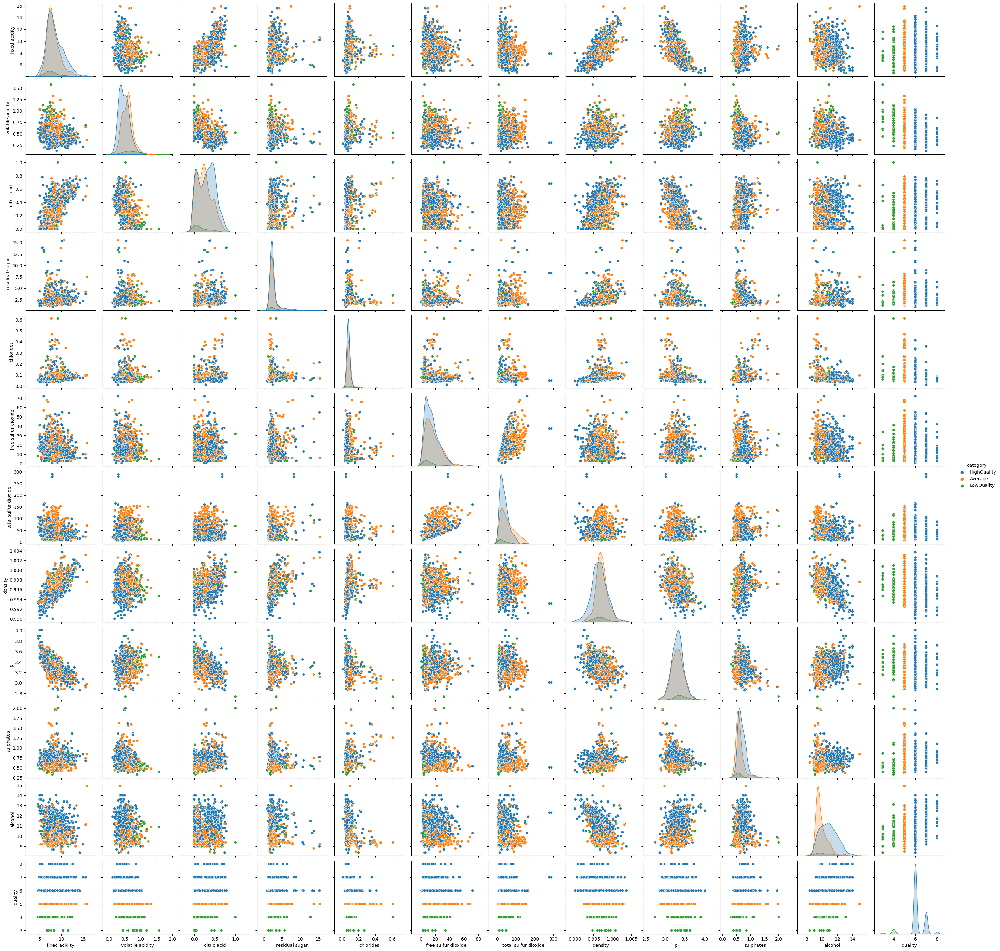

In [ ]:
#Vinos rojos
sns.pairplot(redWines, hue='category', hue_order=['HighQuality', 'Average', 'LowQuality']);

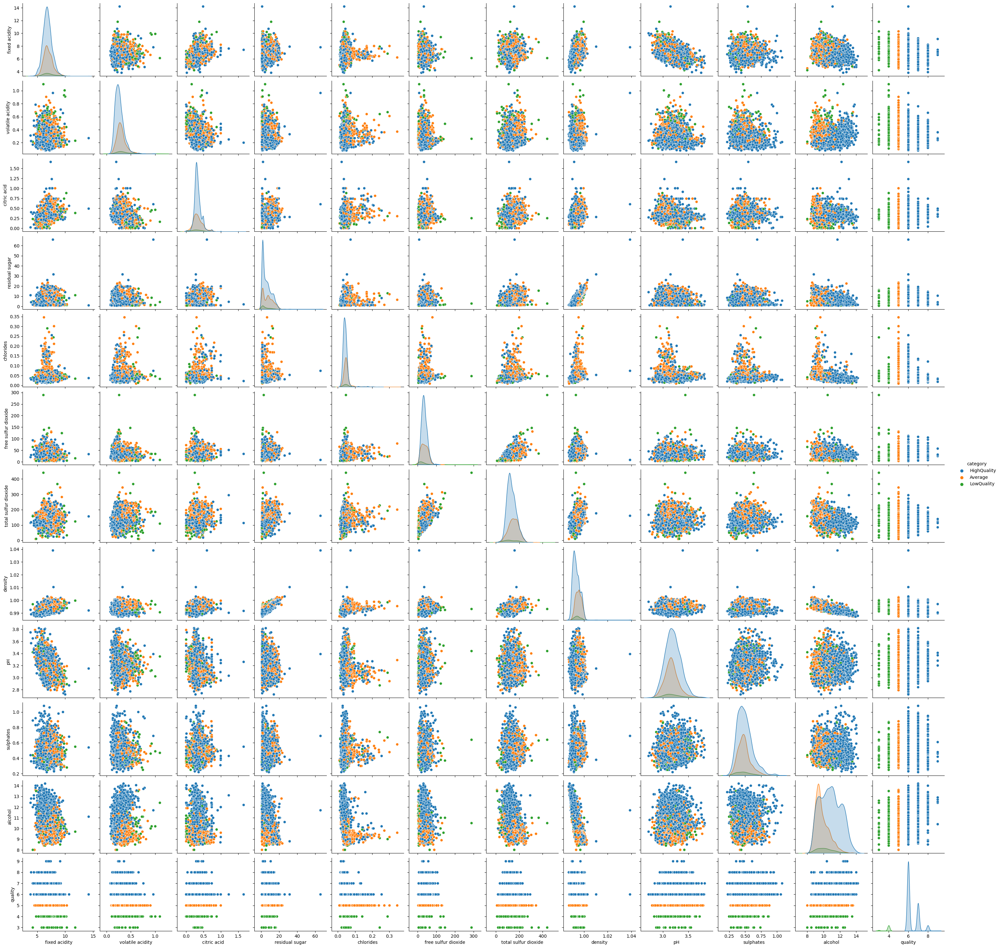

In [ ]:
#Vinos blancos
sns.pairplot(whiteWines, hue='category', hue_order=['HighQuality', 'Average', 'LowQuality']);

A simple vista, podemos notar cómo es que los gráficos no son los más óptimos sobre los cuales trabajar. En ambos datasets notamos como cada correlación presenta outliers, además de una distribución que tan solo complicará mucho más tanto la clasificación como la predicción de los datos.

Cabe notar que no todos los gráficos mostrados nos servirán en nuestro análisis, en especial la diagonal, puesto a ser redundantes, y aquellos donde `quality` es el eje x.

##Análisis de Regresión

Para realizar el análisis exploratorio de datos para la regresión lineal, utilizaremos un heatmap que nos mostrará numéricamente que tan relacionados están cada uno de los datos, donde le pondremos especial énfasis al atributo `quality`, puesto que es aquel que deseamos predecir.

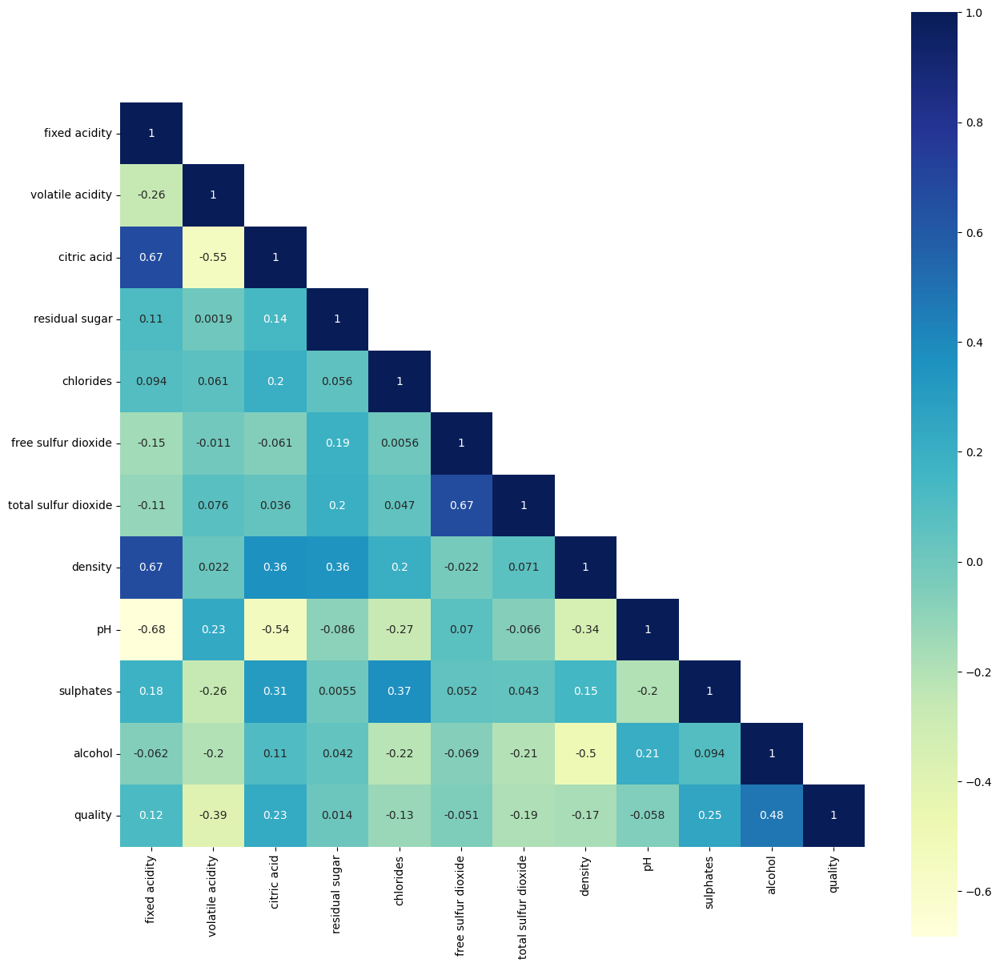

In [ ]:
#@title Vinos tintos
correlation= redWines.corr(numeric_only = True)
mask = np.array(correlation)
mask[np.tril_indices_from(mask)] = False
fig=plt.gcf()
fig.set_size_inches(15,15)
sns.heatmap(data=correlation,mask=mask,square=True,annot=True,cbar=True,cmap="YlGnBu");

En el caso de los vinos tintos, podemos notar que los atributos tienen una baja correlación con respecto a `quality`, siendo el máximo `alcohol`, donde vemos un valor de $0.48$. Luego de este le siguen `sulphates` y `fixed acidity`, luego de los cuales existen valores muy cercanos a 0, e incluso valores negativos.

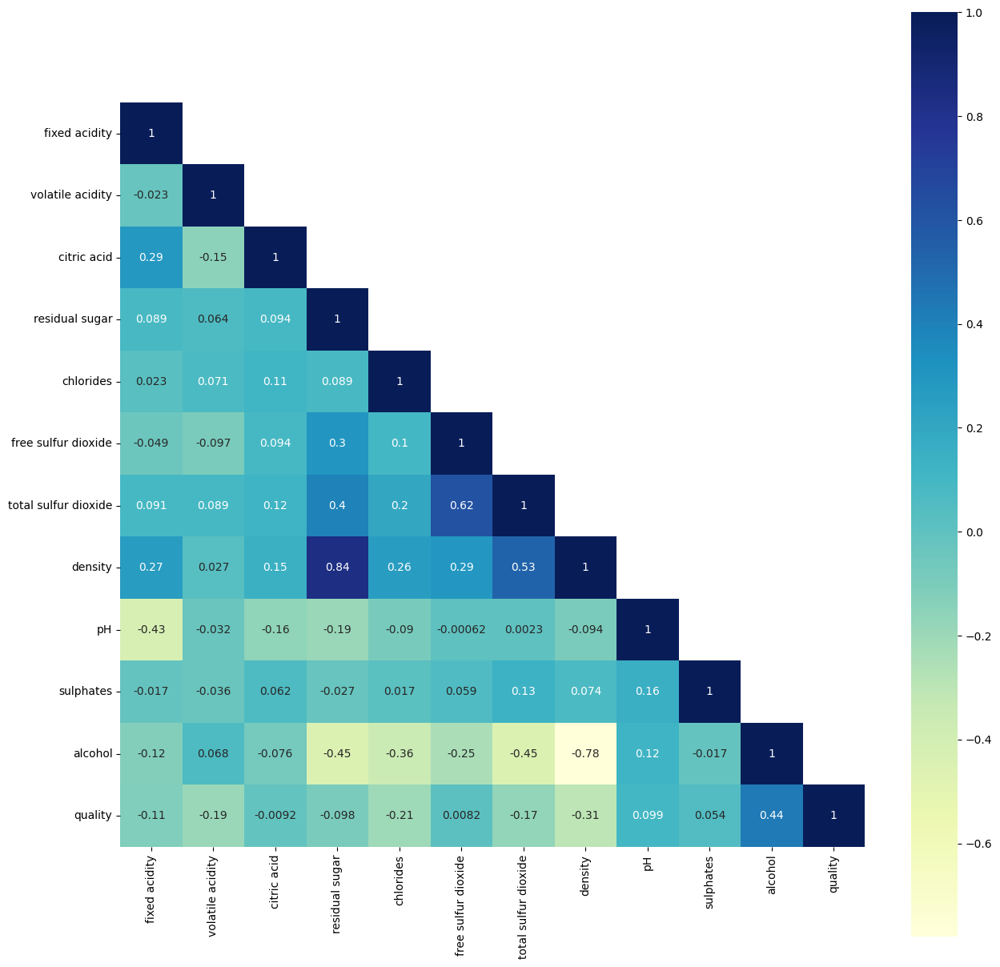

In [ ]:
#@title Vinos blancos
correlation= whiteWines.corr(numeric_only = True)
mask = np.array(correlation)
mask[np.tril_indices_from(mask)] = False
fig=plt.gcf()
fig.set_size_inches(15,15)
sns.heatmap(data=correlation,mask=mask,square=True,annot=True,cbar=True,cmap="YlGnBu");

Por otra parte, notamos una tendencia similar en el dataset de los vinos blancos, puesto que nuevamente `alcohol` logra ser aquel atributo con mayor correlación con `quality`. No obstante, observamos una importante diferencia con respecto al valor que le sigue, que es `pH` con un $0.099$, seguido de más valores menores a 0.

Visto lo anterior, y considerando la naturaleza que poseen las redes neuronales, consideraremos todos los atributos para realizar nuestra regresión, decisión que esperamos entregue buenos resultados. A continuación se muestran los gráficos sobre los que se trabajará el modelo para obtener la mejor recta posible para predecir la calidad del vino.

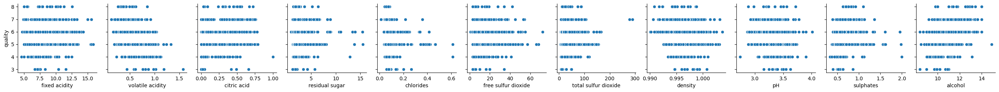

In [ ]:
#Vinos tintos
sns.pairplot(redWines,x_vars=np.array(redWines.columns)[0:11],y_vars="quality");

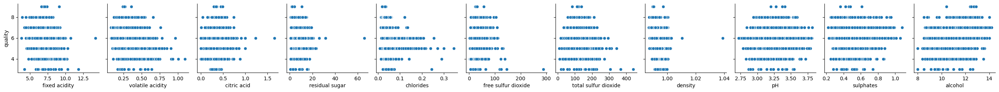

In [ ]:
#Vinos blancos
sns.pairplot(whiteWines,x_vars=np.array(whiteWines.columns)[0:11],y_vars="quality");

##Análisis de Clasificación
Para observar mejor como se distribuyen las categorías `LowQuality`,`Average` y `HighQuality`, podemos hacer un gráfico de barras el cual mostrará cuál de todas estas es la que más "representación" posee en cada dataset.

In [ ]:
order = ['LowQuality', 'Average', 'HighQuality']

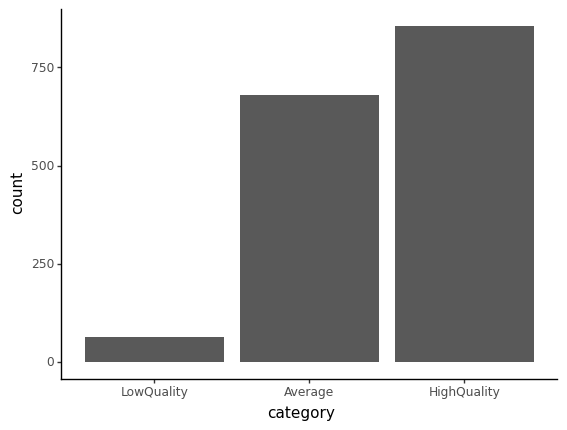

<ggplot: (8768909086201)>

In [ ]:
#Vinos tintos
(
    ggplot(redWines)+
    aes(x='category', y='..count..')+
    geom_bar()+
    theme_classic()+
    scale_x_discrete(limits=order)
)

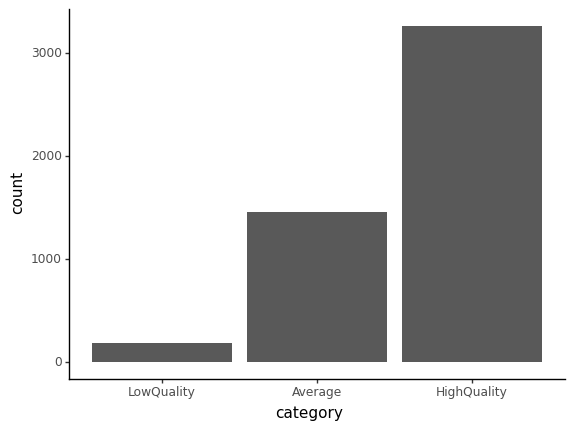

<ggplot: (8768909013182)>

In [ ]:
#Vinos blancos
(
    ggplot(whiteWines)+
    aes(x='category', y='..count..')+
    geom_bar()+
    theme_classic()+
    scale_x_discrete(limits=order)
)

Sacando informacion de los graficos anteriores podemos ver que `HighQuality` tiene una mayor prominecia en cada dataset, caso contrario a lo que fue en el laboratorio anterior. Esto se puede deber al cambio donde ahora la calidad 6 corresponde a un valor alto, mientras que 5 es el promedio. Además, podemos observar que `LowQuality` tiene una menor cantidad de referencias en el DataSet lo que nos indicaria que casi no hay vinos de calidad 0, 1, 2, 3 y 4.

Tambien podemos ver que `Average` tiene una cantidad considerable dentro del DataSet, aunque en comparación los vinos blancos poseen una proporción menor a la que se encuentra en los vinos tintos. Todos estos resultados nos confirma lo dicho por los promedios observados anteriormente, donde notábamos que la calidad 6 se repetía en ambos datasets como la calidad promedio.

Para revisar mejor como se distribuyen los datos, podemos usar los gráficos de caja y bigotes o *boxplot*.

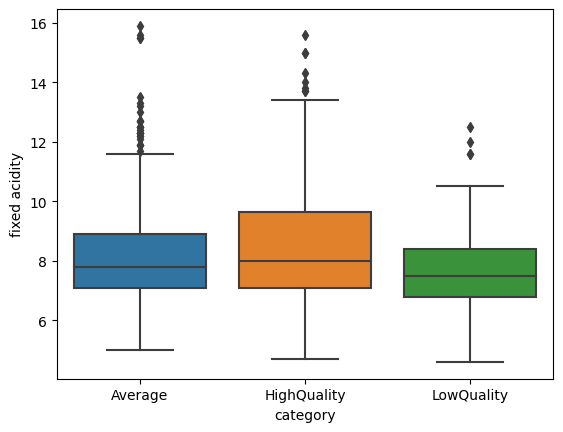

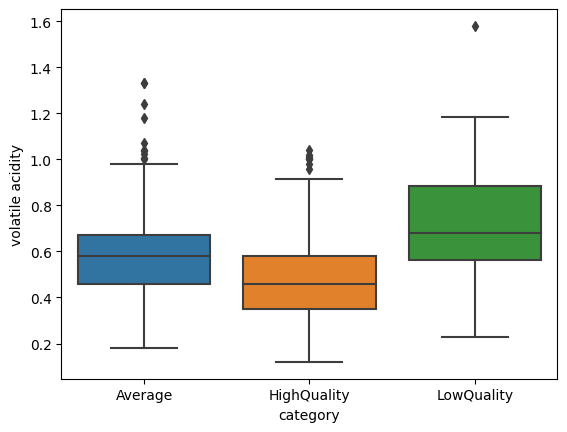

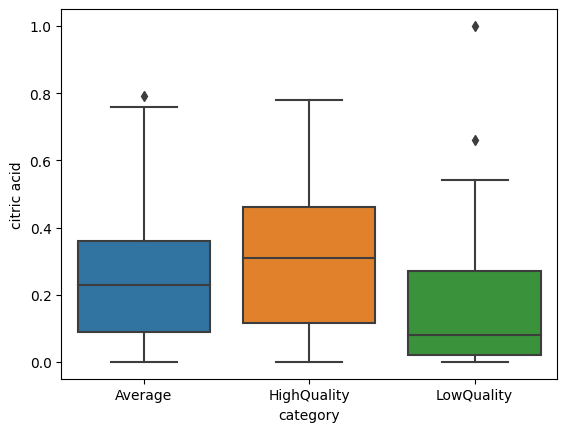

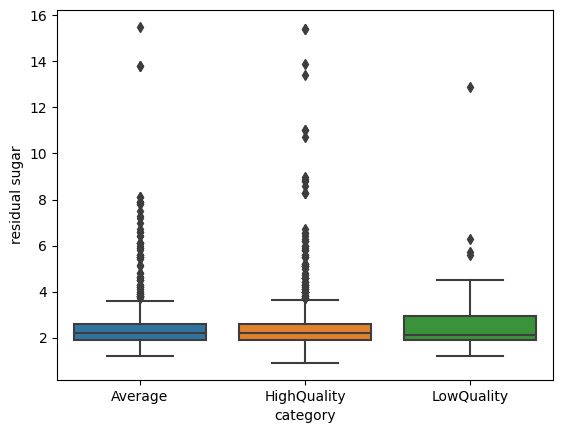

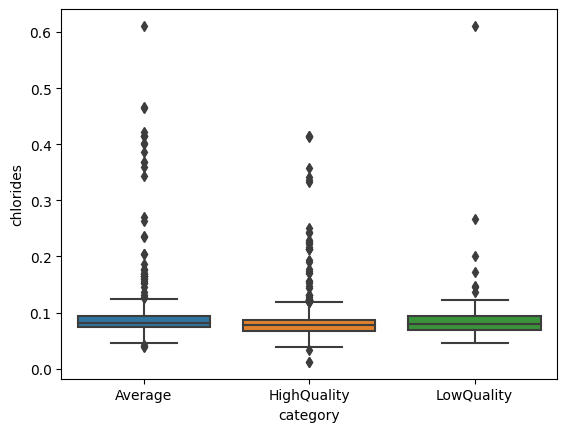

...

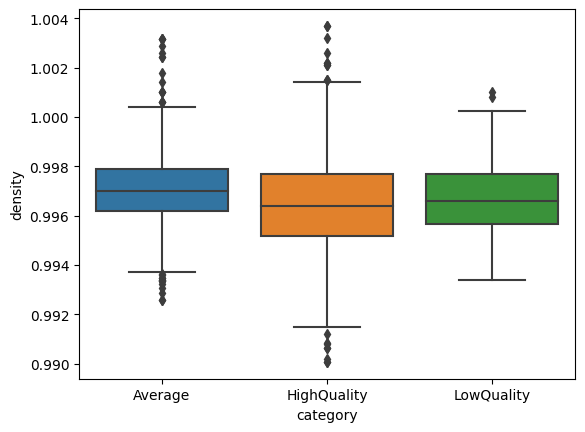

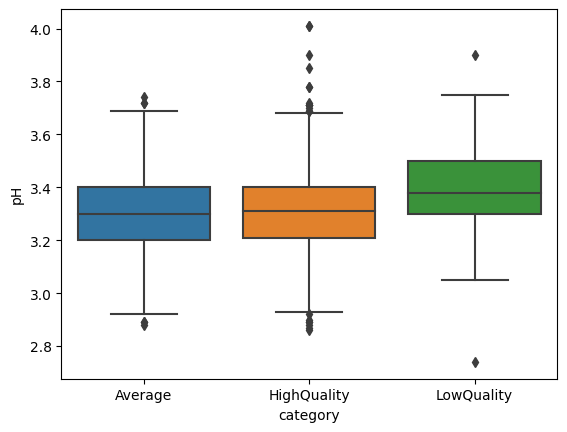

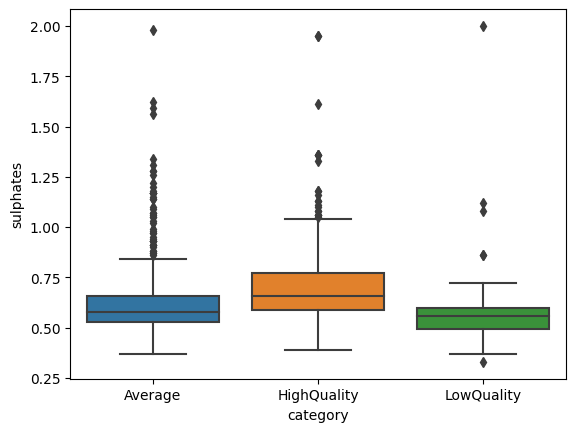

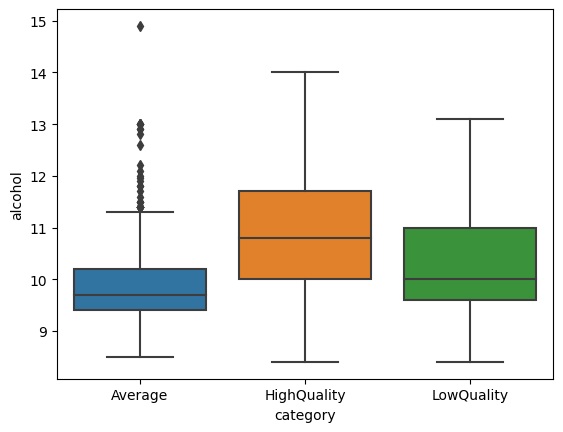

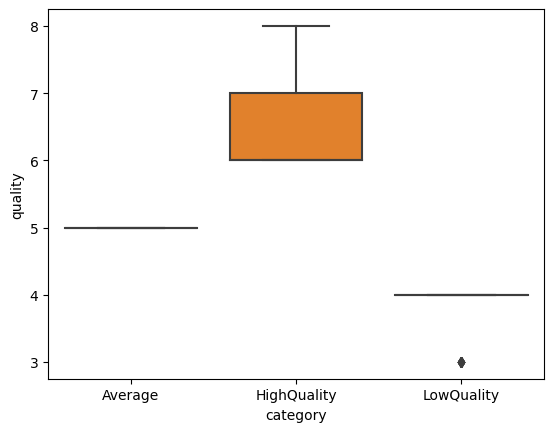

In [ ]:
#@title Vinos tintos
for i in range(12):
  sns.boxplot(x='category', y=redWines.columns[i], data = redWines)
  plt.show()

Analizando los boxplots podemos ver que muchos de éstos presentan una gran cantidad de outliers y no están muy bien distribuidos para realizar una clasificación ideal, por lo que, tal y como lo hicimos con la regresión lineal, consideraremos todos los atributos presentes, ignorando `quality`, para preparar una clasificación que otorgue mejores resultados.

Ahora realizamos el mismo procedimiento con los **vinos blancos**.

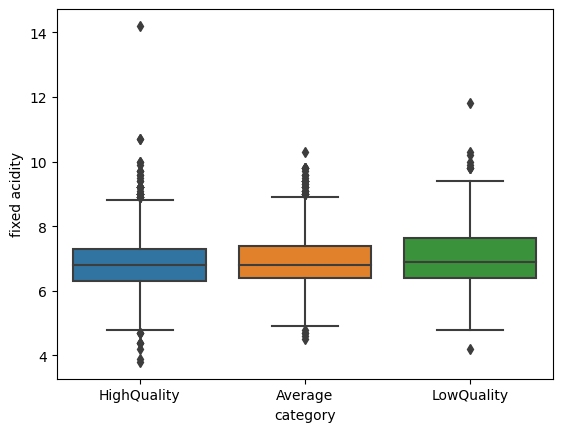

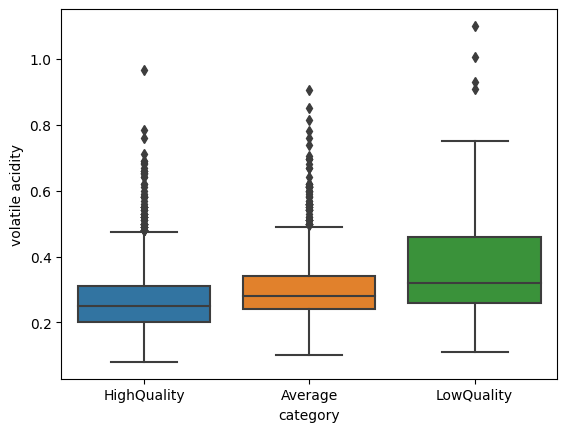

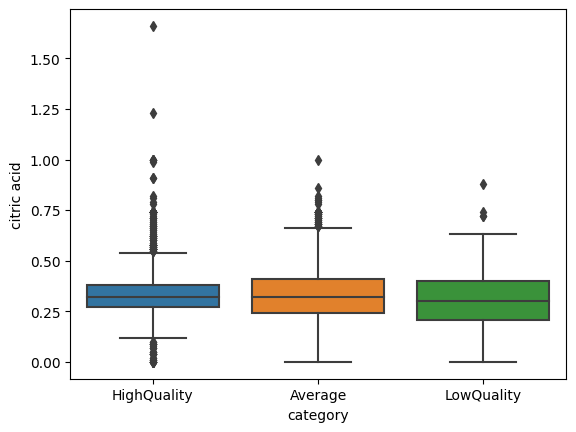

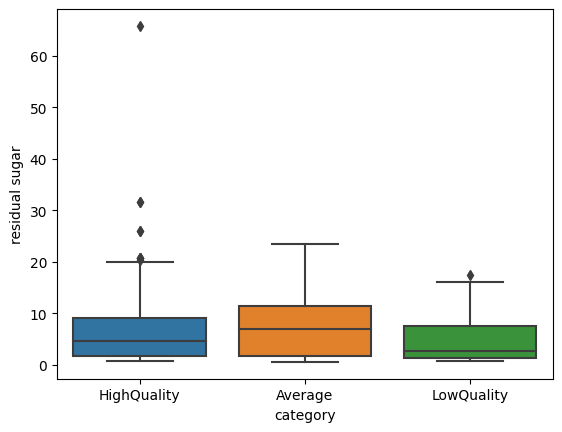

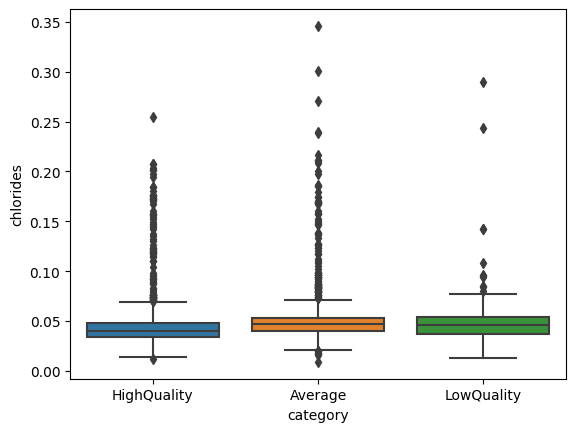

...

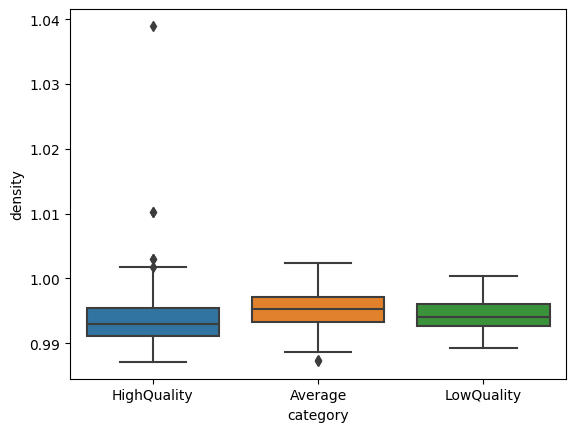

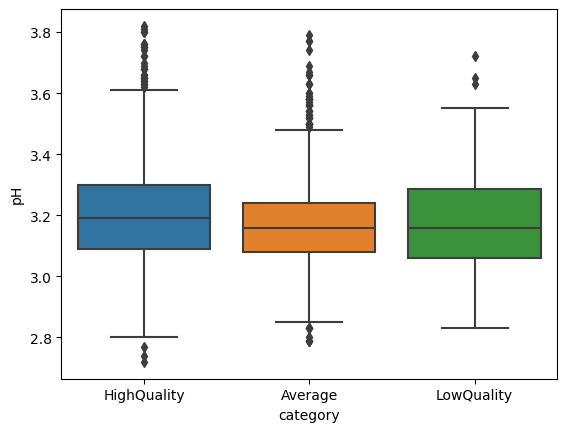

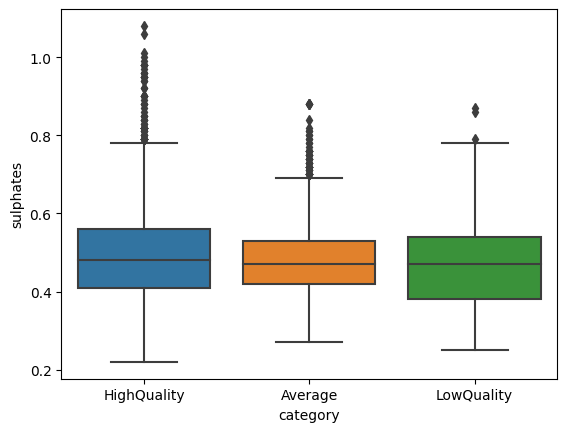

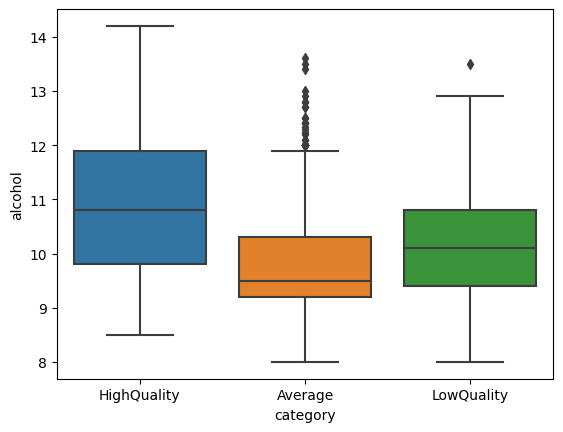

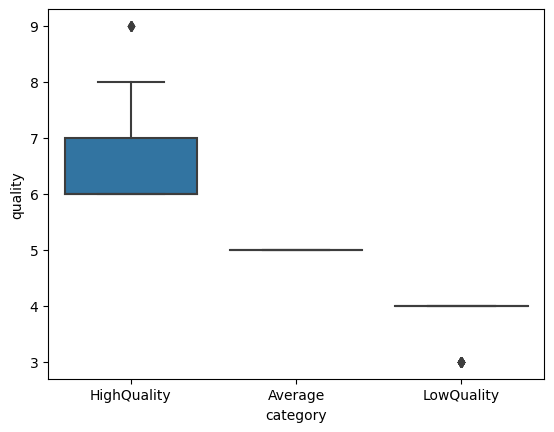

In [ ]:
#@title Vinos blancos
for i in range(12):
  sns.boxplot(x='category', y=whiteWines.columns[i], data = whiteWines)
  plt.show()

Nuevamente podemos apreciar que los boxplots tienen outliers y no todos los atributos logran distribuir muy bien las categorías, por lo que, para mantener la consistencia, por lo que igualmente utilizamos todos los atributos para realizar nuestro modelo de clasificación, otra vez ignorando el atributo `quality` debido a la redundancia que esto tendría.

#Función de construcción de la red
A continuación, en el siguiente bloque de código se creará una función que nos permitirá construir la red neuronal considerando el tipo de modelo a realizar, además de la función de activación que se utilizará en cada capa.

In [65]:
def construirRed(modelType, activationFunction, data):
  if modelType == 'regression':
    modeloR = models.Sequential()

    #Se crean las capas ocultas. Al querer usar todas las variables, especificamos que
    #las dimensiones a trabajar serán 11
    modeloR.add(layers.Dense(128, activation=activationFunction, input_dim=11))
    modeloR.add(layers.Dense(64, activation=activationFunction))
    modeloR.add(layers.Dense(32, activation=activationFunction))
    modeloR.add(layers.Dense(16, activation=activationFunction))

    #Se crea la capa de salida
    modeloR.add(layers.Dense(1, activation=activationFunction))

    #Se compila el modelo
    modeloR.compile(loss='mse', optimizer='adam', metrics=['mae']) #Función de pérdida: MSE
                                                                   #Métrica de error: MAE

    #Se retorna el modelo para regresión
    return modeloR

  elif modelType == 'classification':
    modeloC = models.Sequential()

    #Se crean las capas ocultas. Al querer usar todas las variables, especificamos que
    #las dimensiones a trabajar serán 11
    modeloC.add(layers.Dense(128, activation=activationFunction, input_dim=11))
    modeloC.add(layers.Dense(64, activation=activationFunction))
    modeloC.add(layers.Dense(32, activation=activationFunction))
    modeloC.add(layers.Dense(16, activation=activationFunction))

    modeloC.add(layers.Dense(3, activation='softmax'))

    #Se compila el modelo
    modeloC.compile(loss='categorical_crossentropy',optimizer='adam', metrics=['accuracy']) #Función de pérdida: Categorical Crossentropy
                                                                                            #Métrica de error: precisión (accuracy)

    return modeloC
  else:
    print('modelo no reconocido')
    return 0

Podemos observar que la función recibe tres parámetros:
* `modelType`: especifica qué modelo se realizará (regresión lineal o clasificación).
* `data`: corresponde al eje X del dataset sobre el cual se trabajará.
* `activationFunction`: corresponde a la función de activación que define la salida de los nodos.

De este último, en este laboratorio específicamente se trabajará con dos opciones para el posterior análisis comparativo de su rendimiento:
* Función logística (sigmoid): transforma los valores introducidos a una escala $(0,1)$, donde los valores altos tienden de manera asintótica a $1$, mientras que los valores bajos lo hacen a $0$.

    $f(x) = \frac{1}{(1-e^{-x})}$

* Función tangente hiperbólica (tanh): A diferencia del anterior, esta función trabaja transformando los valores introducidos en una escala de $(-1, 1)$, donde los valores altos tienden de manera asintótica a $1$ y los bajos a $-1$.

    $f(x) = \frac{2}{1+e^{-2x}}-1$

Por otra parte, la cantidad de neuronas de entrada es 128, disminuyendo en la mitad por cada capa oculta presente, además de una cantidad de 5 capas en total para cada modelo. Se ha decidido trabajar con estos números con tal de obtener los mejores resultados posibles, considerando la cantidad de datos que contiene cada dataset, ambos estando sobre los 1000 datos por cada uno, por lo que una red más compleja y amplia teóricamente retornará mejores resultados en los modelos.

Nótese que, al momento de crear el modelo de clasificación, en la última capa se utiliza como función de activación **softmax**. Esto debido a que es la más adecuada y recomendable para clasificaciones multiclase en redes neuronales debido a que logra representar distribuciones categorizadas. Ésta es una generalización de la función logística.

#Regresión lineal con redes neuronales
En este laboratorio, procederemos a implementar un modelo de regresión lineal que sea capaz de predecir la calidad del vino considerando todos los atributos de cada dataset, ignorando `quality`. Esta implementación se hará mediante el uso de **redes neuronales** que proporciona la librería `keras`.

El código considerará la implementación de K-Fold Cross Validation para el entrenamiento, y se medirá su rendimiento mediante el $MAE$ y $MSE$. Todo esto en pie de realizar un análisis comparativo entre utilizar las siguientes funciones de activación: **función logística (sigmoid)** y **función tangente hiperbólica (tanh)**.

In [54]:
def NN_LinearRegression(x_axis, y_axis, dataset, activationFunction):
  #A partir de los valores x_axis e y_axis, tomamos estas columnas y agarramos sus valores
  #como listas, con tal de poder trabajar sin problema con estos.
  x = dataset[x_axis].values

  #Normalizamos los datos del eje x
  sc = StandardScaler()
  x = sc.fit_transform(x)

  y = dataset[y_axis].values

  #Creamos listas vacías para almacenar las métricas de cada iteración de KFold
  mse_scores = []
  mae_scores = []

  #Definimos como trabajaremos con K-Fold, donde serán 5 divisiones
  kfold = KFold(n_splits=5, shuffle=True, random_state=42)
  for train_index, test_index in kfold.split(x): #Vamos por cada una de ellas
    #Definimos los datos de entrenamiento y testeo
    xTrain, yTrain = x[train_index], y[train_index]
    xTest, yTest = x[test_index], y[test_index]

    #Construimos nuestro modelo de regresión lineal
    modelo = construirRed('regression', activationFunction, x)

    #Ajustamos nuestro modelo a los datos entregados
    modelo.fit(xTrain, yTrain, epochs=50, verbose=0) #Epochs = 50 veces que se realiza el backpropagation
                                                     #Considerando el tamaño del dataset, creemos es suficiente

    #Con el modelo generamos un vector de predicciones
    yPred = modelo.predict(xTest, verbose=0)

    #Calculamos el error cuadrático medio y el error absoluto medio
    score = modelo.evaluate(xTest, yTest, verbose = 0)
    mse_scores.append(score[0])
    mae_scores.append(score[1])

  return np.mean(mse_scores), np.mean(mae_scores)

##Vinos tintos

In [55]:
x_axisR = np.array(redWines.columns)[0:11]

In [56]:
#@title Función de activación logística
mse_rS, mae_rS = NN_LinearRegression(x_axisR, 'quality', redWines, 'sigmoid')

In [57]:
#print("Precisión de clasificación con el atributo alcohol: %.3f%%" % (scores_aCS*100))
print(f"MSE promedio = {mse_rS:.3f}")
print(f'MAE promedio = {mae_rS:.3f}')

MSE promedio = 22.156
MAE promedio = 4.637


In [58]:
#@title Función de activación tangente hiperbólica
mse_rT, mae_rT = NN_LinearRegression(x_axisR, 'quality', redWines, 'tanh')

In [59]:
print(f'MSE promedio = {mse_rT:.3f}')
print(f'MAE promedio = {mae_rT:.3f}')

MSE promedio = 22.145
MAE promedio = 4.636


##Vinos blancos

In [60]:
x_axisW = np.array(whiteWines.columns)[0:11]

In [61]:
#@title Función de activación logística
mse_wS, mae_wS = NN_LinearRegression(x_axisW, 'quality', whiteWines, 'sigmoid')

In [62]:
print(f'MSE promedio = {mse_wS:.3f}')
print(f'MAE promedio = {mae_wS:.3f}')

MSE promedio = 24.579
MAE promedio = 4.878


In [63]:
#@title Función de activación tangente hiperbólica
mse_wT, mae_wT = NN_LinearRegression(x_axisW, 'quality', whiteWines, 'tanh')

In [64]:
print(f'MSE promedio = {mse_wT:.3f}')
print(f'MAE promedio = {mae_wT:.3f}')

MSE promedio = 24.578
MAE promedio = 4.878


##Conclusión
Por lo tanto, observando los resultados obtenidos en ambos datasets, es visible que el modelo de regresión lineal que considera como función de activación la **tangente hiperbólica** es mejor, pero solo por una leve diferencia, donde el Error Cuadrático Medio es más cercano a 0. Algo curioso es lo que sucede en los vinos blancos, donde esta métrica es diferente por tan solo una milésima, mientras que el MAE tiene el mismo valor en ambos casos.

#Clasificación con redes neuronales

En esta segunda parte, procederemos a implementar un modelo de clasificación para cada dataset, el cual sea capaz de clasificar todos los atributos de cada uno con respecto a la categoría de calidad del vino (`category`). Esta implementación se hará mediante el uso de **redes neuronales** que proporciona la librería Keras.

Al igual que en el bloque anterior, se considerará el uso de la técnica de K-Fold Cross Validation al momento de entrenar el modelo, además de comparar cada uno de acuerdo a la métrica de precisión. Esta comparación se hará en base a la implementación de las funciones de activación (sigmoid y tanh).

Para una mejor compatibilidad con las diferentes funciones con las cuales haremos la clasificación, se añade la columna `categoryNum`, que almacena cada categoría de forma numérica de la siguiente forma:
* `LowQuality = 1`
* `Average = 2`
* `HighQuality = 3`

In [66]:
categoryNum = {0:1, 1:1, 2:1, 3:1, 4:1, 5:2, 6:3, 7:3, 8:3, 9:3, 10:3}

#Vinos tintos
redWines['categoryNum'] = redWines['quality'].map(categoryNum)
redWines['categoryNum'] = pd.to_numeric(redWines['categoryNum'])

#Vinos blancos
whiteWines['categoryNum'] = whiteWines['quality'].map(categoryNum)
whiteWines['categoryNum'] = pd.to_numeric(whiteWines['categoryNum'])

In [67]:
def NN_Classification(x_axis, classifier, dataset, activationFunction):
  #Escalamos los datos
  x = dataset[x_axis].values
  sc = StandardScaler()
  x = sc.fit_transform(x)

  #Se transforman los valores de y a categorico
  y = dataset[classifier]
  encoder = LabelEncoder()
  encoder.fit(y)
  y = encoder.transform(y)
  y = np_utils.to_categorical(y)

  #Lista vacía para almacenar los puntajes de cada iteración en el KFold
  scores = []

  kfold = KFold(n_splits=5, shuffle=True) #KFold de 5 divisiones

  for train_index, test_index in kfold.split(x): #Empezamos el KFold
    #Dividimos los datos en train y test
    xTrain, yTrain = x[train_index], y[train_index]
    xTest, yTest = x[test_index], y[test_index]

    #Construimos el modelo
    modelo = construirRed('classification', activationFunction, x)

    #Ajustamos el modelo
    modelo.fit(xTrain, yTrain, epochs=50, verbose = 0) #Epochs = 50 veces que se realiza el backpropagation
                                                       #Considerando el tamaño del dataset, creemos es suficiente
    #Evaluamos el modelo
    score = modelo.evaluate(xTest, yTest, verbose = 0)
    scores.append(score)

  return np.mean(scores)

##Vinos tintos

In [68]:
x_axisR = np.array(redWines.columns)[0:11]

In [69]:
#@title Función de activación logística
scores_rS = NN_Classification(x_axisR,'categoryNum',redWines,'sigmoid');

In [70]:
print("Precisión de clasificación: %.3f%%" % (scores_rS*100))

Precisión de clasificación: 68.652%


In [71]:
#@title Función de activación tangente hiperbólica
scores_rT = NN_Classification(x_axisR,'categoryNum',redWines,'tanh')

In [72]:
print("Precisión de clasificación: %.3f%%" % (scores_rT*100))

Precisión de clasificación: 71.923%


##Vinos blancos

In [73]:
x_axisW = np.array(whiteWines.columns)[0:11]

In [74]:
#@title Función de activación logística
scores_wS = NN_Classification(x_axisW,'categoryNum',whiteWines,'sigmoid');

In [75]:
print("Precisión de clasificación: %.3f%%" % (scores_wS*100))

Precisión de clasificación: 66.479%


In [76]:
#@title Función de activación tangente hiperbólica
scores_wT = NN_Classification(x_axisW,'categoryNum',whiteWines,'tanh')

In [77]:
print("Precisión de clasificación: %.3f%%" % (scores_wT*100))

Precisión de clasificación: 71.376%


##Conclusión
Finalmente, en el caso del modelo de clasificación, notamos como se repite lo sucedido anteriormente, puesto que aquellos que clasifican los valores considerando como función de activación la **tangente hiperbólica** para las capas ocultas de la red obtuvo mejores resultados, es decir, una mejor precisión. Esto puede significar que esta función nos otorga una menor cantidad de error en ambos datasets, notablemente en el de los vinos tintos, donde se logró la mejor precisión de todos los modelos con un $71.923\%$. Mientras tanto, aquellos que utilizan la función sigmoide obtuvieron una precisión en un rango de $60-69\%$, que, aunque no es tan malo, si es menor en comparación de los otros casos.